<a href="https://colab.research.google.com/github/amanmeka/DataScience/blob/main/Unit8/AmanMekaU8proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install -q pymc-bart
!pip install -q "preliz[full,notebook]"
!pip install -q bambi
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
import graphviz as gv
import pymc_bart as pmb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.9/179.9 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 25.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.0/519.0 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 513.9/513.9 kB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.6/109.6 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.9/218.9 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.4/259.4 kB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4

# Unit 8 Project: Predicting Salary

**Task**:

Two parts:

1. Propose a data set that's compatible with a pymc_bart model. I must approve your submission before you move on to part 2.

2. Create, analyze, and present BART model, using pymc_bart within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is)
  - You must argue why your variable selection is justified. You may use either a theoretical or numerical argument. Additionally, you must comment on any potential interactions between your predictor variables.



In [3]:
link = "https://raw.githubusercontent.com/amanmeka/DataScience/refs/heads/main/datasci%20analysis%20-%20salary%20nba.csv"
bball = pd.read_csv(link)

In [4]:
bball_processed = bball.rename(columns={
    '2P': 'TwoP',
    '2PA': 'TwoPA',
    '3P': 'ThreeP',
    '3PA': 'ThreePA',
    'FG%': 'FG_percent',
    '2P%': 'TwoP_percent',
    '3P%': 'ThreeP_percent',
    'FT%': 'FT_percent'
})

all_relevant_columns = [
    'SALARY', 'Age', 'MP', 'FG', 'FGA', 'PTS', 'TwoP', 'TwoPA', 'ThreeP', 'ThreePA',
    'TRB', 'AST', 'STL', 'PF', 'FG_percent', 'FT_percent', 'TOV', 'FT', 'FTA'
]

# Drop rows with NaN values in any of these critical columns
bball_processed = bball_processed.dropna(subset=all_relevant_columns)

print(f"Shape of processed DataFrame after dropping NaNs: {bball_processed.shape}")

Shape of processed DataFrame after dropping NaNs: (588, 31)


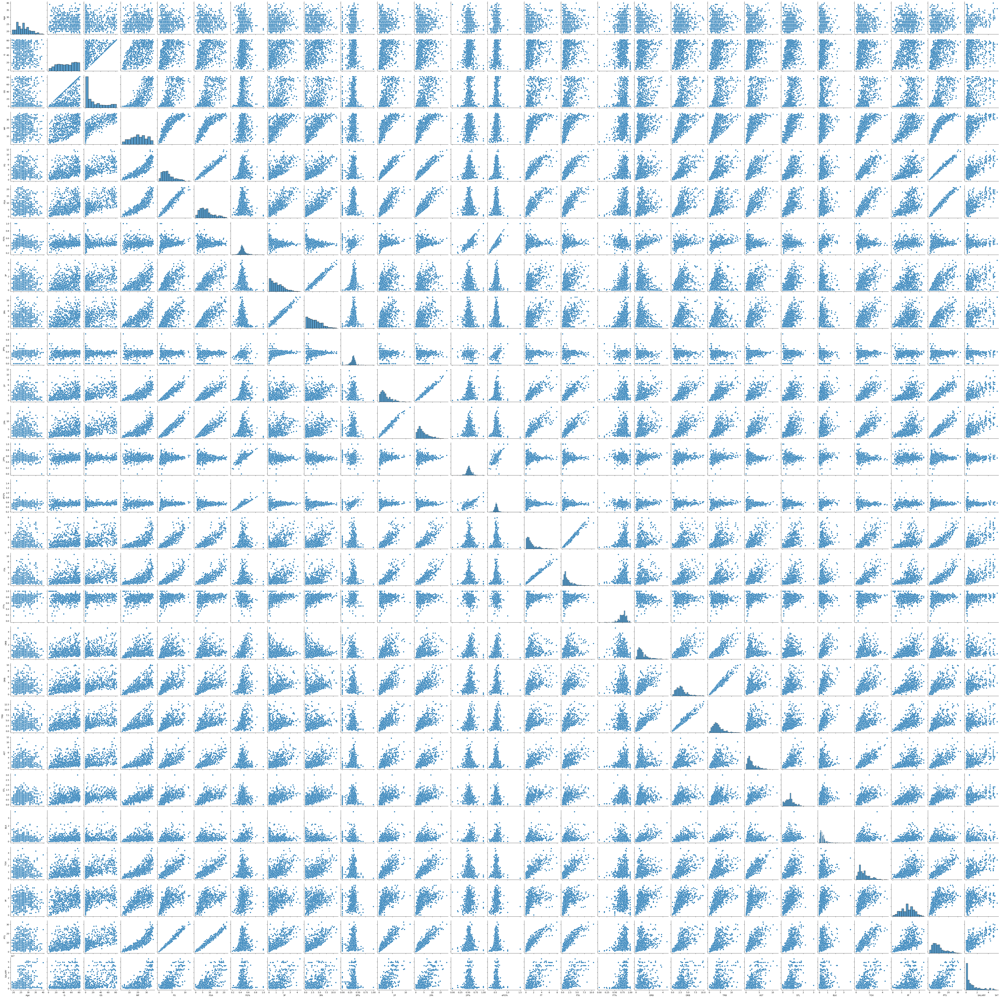

In [5]:
sns.pairplot(bball)

Because I want to predict salary, I will make it a little easier to view the trends.

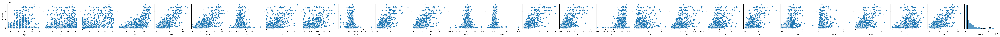

In [6]:
sns.pairplot(bball, y_vars=['SALARY'])
plt.show()

Notable Trends:
* Age
  - I think that age actually plays a much bigger role than you might think because an NBA player's salary increases with experience. younger players obviously have relatively less experience, which is why they get paid less even though they play at the same level as other players.
* MP
  - The more minutes you play, the more valuable you are to the team, which also means that you are probably paid relatively more
* FG/FGA/FG%
  - If you are taking and making more shots then you are probably a much more vital player to the team as most offense flows through you. This means you are paid more. This covers 2P and 3P.
* 2P/2PA/2P%
* 3P/3PA/3P%
* FT/FTA/FT%
* TRB
  - The more you are getting rebounds, the more likely you are to be paid more because rebounding is a vital part of hte game.
* AST
  - Assists are just as important as made shots because passing the ball to a player with a good look is a hard skill to learn. Therefore you are probably paid more if you assist more.
* STL
  - The more steals, the more you get paid. This one is not that strong of a trend.
* TOV (not as it might seem though)
  - Although it might seem like the more turnovers you have the less you play, that is not the case. It is unfair to say that more turnovers = less pay because if you have the ball more then you are more likely to have more turnovers. That doesn't necessarily mean that you are a worse player.
* PF (also a tricky one)
  - This one is tricky because everyone on the court fouls, and it has almost nothing to do with skill or salary. But if you have more fouls, then you are probably on the court more so that very indirectly means that you are a big part of the game. Most people that foul out of games are good players that are vital to the defense of a team.
* PTS
  - This one goes without saying, the more points you get, the more you get paid. Although this one also gives a bit of an illusion too.

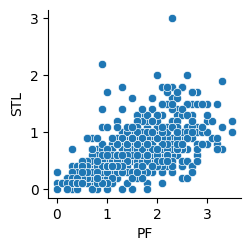

In [7]:
sns.pairplot(bball, y_vars=['STL'], x_vars=['PF'])
plt.show()

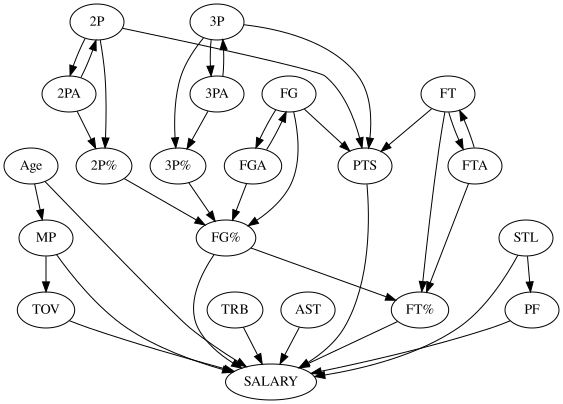

In [8]:
#multiple predictor causal diagram
dag_b = gv.Digraph() #b for bikes

dag_b.node('A', 'Age')
dag_b.node('B', 'MP')

dag_b.node('C', 'FG')
dag_b.node('D', 'FGA')
dag_b.node('E', 'FG%')

dag_b.node('F', '2P')
dag_b.node('G', '2PA')
dag_b.node('H', '2P%')

dag_b.node('I', '3P')
dag_b.node('J', '3PA')
dag_b.node('K', '3P%')

dag_b.node('L', 'FT')
dag_b.node('M', 'FTA')
dag_b.node('N', 'FT%')

dag_b.node('O', 'TRB')
dag_b.node('P', 'AST')
dag_b.node('Q', 'STL')
dag_b.node('R', 'TOV')
dag_b.node('S', 'PF')
dag_b.node('T', 'PTS')
dag_b.node('Z', 'SALARY')


dag_b.edges(['AZ', 'AB', 'BZ', 'DC', 'CD', 'CE', 'DE', 'GF', 'FG', 'FH', 'GH', 'JI', 'IJ', 'IK', 'JK', 'LM', 'ML', 'LN', 'MN', 'OZ', 'PZ', 'QZ', 'RZ', 'SZ', 'TZ', 'EN', 'HE', 'KE', 'EZ', 'NZ', 'CT', 'FT', 'IT', 'LT', 'BR', 'QS'])

dag_b

I could have added a lot more interactions between each element in this DAG but I felt like this was a good representation. I also didn't want to overcomplicate things.

# BART Model

(array([309., 102.,  59.,  35.,  28.,  15.,  19.,  18.,  11.,   5.]),
 array([  113055. ,  5677871.1, 11242687.2, 16807503.3, 22372319.4,
        27937135.5, 33501951.6, 39066767.7, 44631583.8, 50196399.9,
        55761216. ]),
 <BarContainer object of 10 artists>)

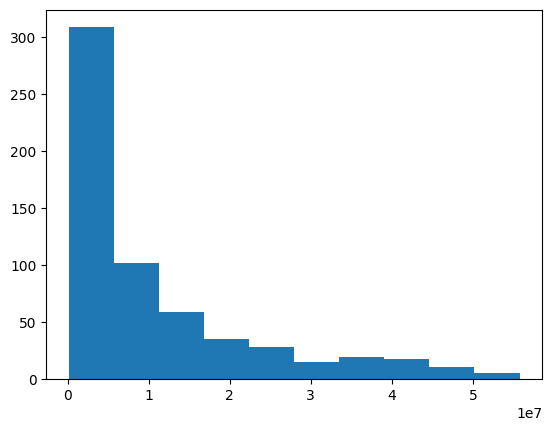

In [9]:
plt.hist(bball.SALARY)

In [10]:
bball = bball_processed

In [11]:
X = bball[["Age", "MP", "FG", "FGA", "PTS", "TwoP", "TwoPA", "ThreeP", "ThreePA","TRB", "AST", "STL", "PF", "FG_percent", "FT_percent", "TOV", "FT", "FTA"]]

Y = bball_processed["SALARY"].values

In [ ]:
with pm.Model() as model_ball:
  mu = pmb.BART("mu", X, Y, m=25)

  sigma = pm.HalfNormal("sigma", sigma=1)
  y_c = pm.Normal("y_c", mu=mu, sigma=sigma, observed=Y)

  idata_ball = pm.sample()

  pm.sample_posterior_predictive(idata_ball, extend_inferencedata=True)

In [ ]:
pm.sample_posterior_predictive(idata_ball,model_ball, extend_inferencedata=True)

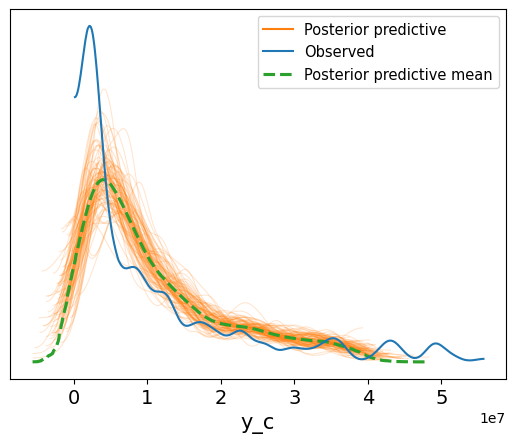

In [14]:
ax = az.plot_ppc(idata_ball, num_pp_samples=100, colors=["C1", "C0", "C2"])

This seems to fit the observed data decently well!

Let me try a different approach.

In [15]:
posterior_mean = idata_ball.posterior["mu"]

μ_hdi = az.hdi(ary=idata_ball, group="posterior", var_names=["mu"], hdi_prob=0.74)

pps = az.extract(
    idata_ball, group="posterior_predictive", var_names=["y_c"]
)

/usr/local/lib/python3.12/dist-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


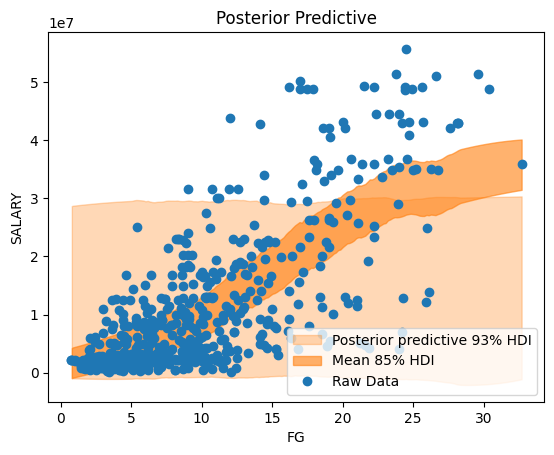

In [16]:
thing = "PTS"

idx = np.argsort(bball[thing].to_numpy())
fig, ax = plt.subplots()

az.plot_hdi(
    x=bball[thing].to_numpy()[idx],
    y=pps.to_numpy()[:, idx],
    ax=ax,
    hdi_prob=0.93,
    fill_kwargs={"alpha": 0.3, "label": r"Posterior predictive 93% HDI"},
)

az.plot_hdi(
    x=bball[thing].to_numpy()[idx],
    y=posterior_mean.to_numpy()[:, :, idx],
    ax=ax,
    hdi_prob=0.85,
    fill_kwargs={"alpha": 0.6, "label": r"Mean 85% HDI"},
)
ax.plot(bball[thing], bball["SALARY"], "o", c="C0", label="Raw Data")
ax.legend(loc="lower right")
ax.set(
    title="Posterior Predictive",
    xlabel="FG",
    ylabel="SALARY",
);

array([<Axes: xlabel='Age'>, <Axes: xlabel='MP'>, <Axes: xlabel='FG'>,
       <Axes: xlabel='FGA'>, <Axes: xlabel='PTS'>, <Axes: xlabel='TwoP'>,
       <Axes: xlabel='TwoPA'>, <Axes: xlabel='ThreeP'>,
       <Axes: xlabel='ThreePA'>, <Axes: xlabel='TRB'>,
       <Axes: xlabel='AST'>, <Axes: xlabel='STL'>, <Axes: xlabel='PF'>,
       <Axes: xlabel='FG_percent'>, <Axes: xlabel='FT_percent'>,
       <Axes: xlabel='TOV'>, <Axes: xlabel='FT'>, <Axes: xlabel='FTA'>],
      dtype=object)

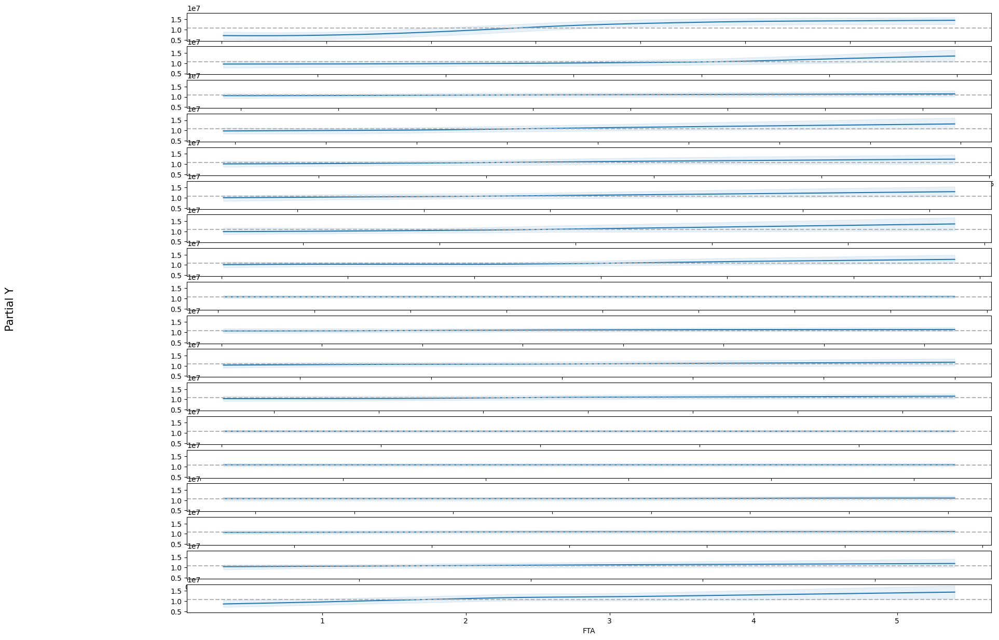

In [17]:
pmb.plot_pdp(mu, X, Y, figsize = (20,15))

/usr/local/lib/python3.12/dist-packages/pymc_bart/utils.py:494: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='Age'>, <Axes: xlabel='MP'>, <Axes: xlabel='FG'>,
       <Axes: xlabel='FGA'>, <Axes: xlabel='PTS'>, <Axes: xlabel='TwoP'>,
       <Axes: xlabel='TwoPA'>, <Axes: xlabel='ThreeP'>,
       <Axes: xlabel='ThreePA'>, <Axes: xlabel='TRB'>,
       <Axes: xlabel='AST'>, <Axes: xlabel='STL'>, <Axes: xlabel='PF'>,
       <Axes: xlabel='FG_percent'>, <Axes: xlabel='FT_percent'>,
       <Axes: xlabel='TOV'>, <Axes: xlabel='FT'>, <Axes: xlabel='FTA'>],
      dtype=object)

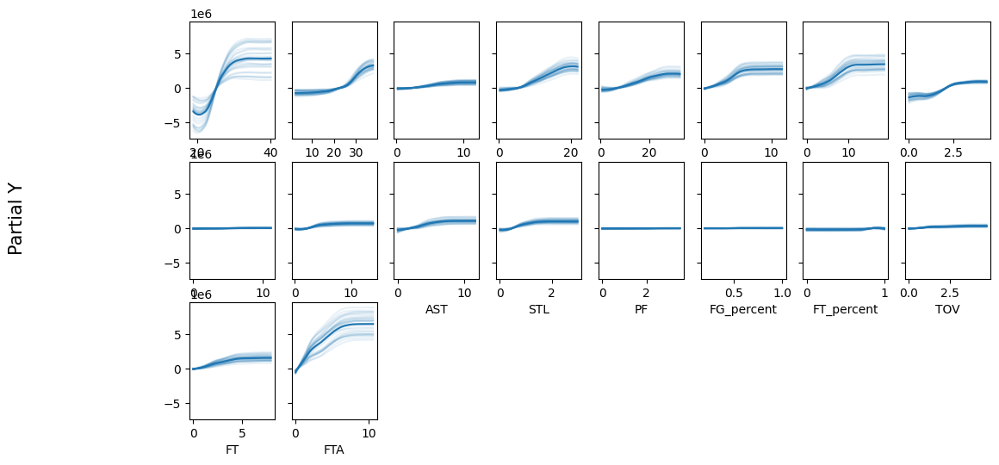

In [18]:
pmb.plot_ice(mu, X, Y, grid=(1, 8), figsize = (12,6))

In [19]:
vi_ball = pmb.compute_variable_importance(idata_ball, mu, X)

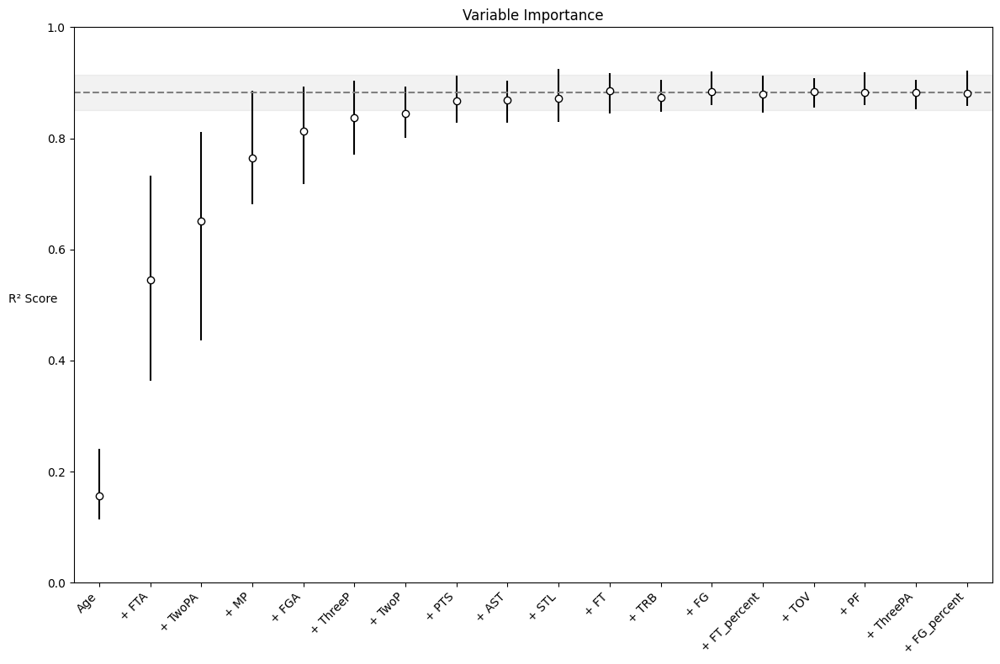

In [21]:
fig, ax = plt.subplots(figsize=(12, 8))
pmb.plot_variable_importance(vi_ball, ax=ax)
ax.set_title('Variable Importance')
ax.set_ylabel('R² Score')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Conclusion:
* A lot of the variables have very low influence (i.e. FT, PF, STL, etc.)
* Age, MP, and PTS had a large effect. Age was  surprisingly a lot but it sort of makes sense.
* FTA has a very high importance too, and I think the reason why is because the people that usually take the most free throws are big centers or forwards who drive into the paint. Those kinds of players are paid relatively higher. So that might be why. I'm curious as to why FT also doesn't play that much of a role (maybe because those kinds of players have less make rate, but just a theory).